In [105]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"
import importlib

import time
import numpy as np
import random
import copy
from scipy.special import gammaln, loggamma
import seaborn as sns
from collections import defaultdict
from multiprocessing import Pool

from matplotlib.pyplot import show
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as py                                                                                                                                                                                         
import plotly.graph_objs as go
plt.style.use('ggplot')
py.init_notebook_mode()

In [11]:
import pickle

In [12]:
from dpmm import *

In [78]:
with open('clustering.large.sm.pkl', mode='rb') as f:
    cluster = pickle.load(f)

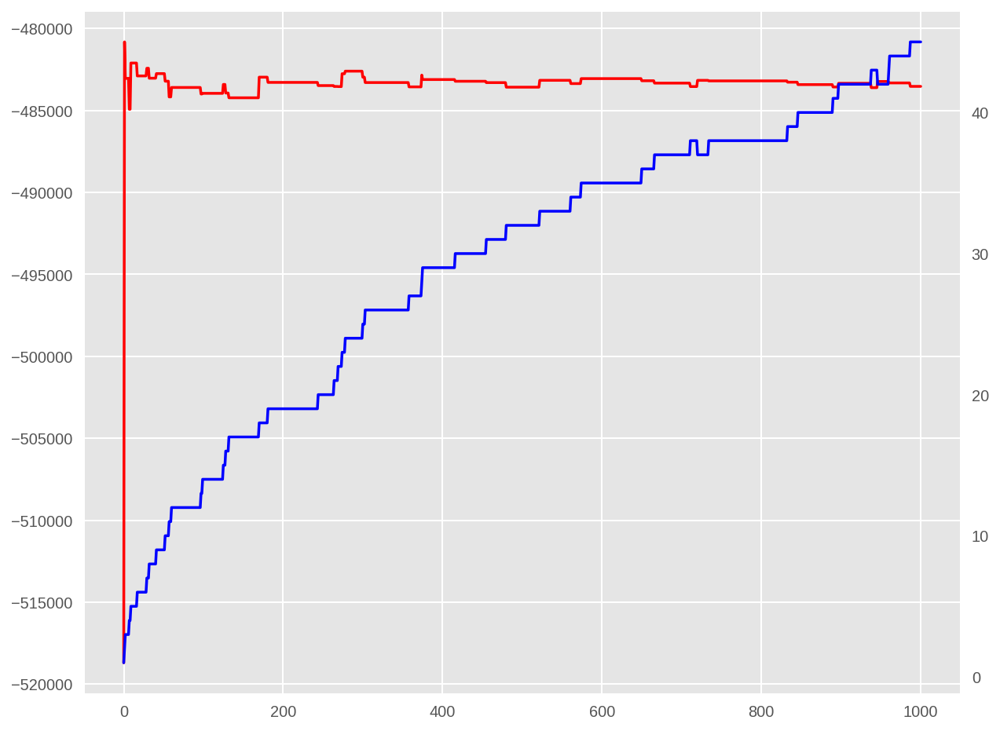

In [80]:
cluster.plot_transition()

In [76]:
cluster.s[:100]

array([813, 803, 717, 774, 902, 774, 906, 649, 724, 771, 910, 864, 814,
       803, 813, 803, 803, 717, 813, 777, 627, 606, 803, 864, 870, 848,
       654, 819, 894, 771, 899, 615, 787, 844, 220, 724, 724, 724, 903,
       903, 788, 819, 724, 821, 867, 540, 882, 649, 724, 906, 860, 907,
       903, 872, 724, 615, 787, 283, 904, 905, 788, 910, 627, 906, 848,
       860, 848, 903, 913, 867, 860, 635, 903, 220, 903, 897, 844, 654,
       720, 913, 328, 826, 826, 897, 556, 848, 556, 328, 661, 611, 848,
       661, 863, 903, 794, 661, 875, 774, 844, 661])

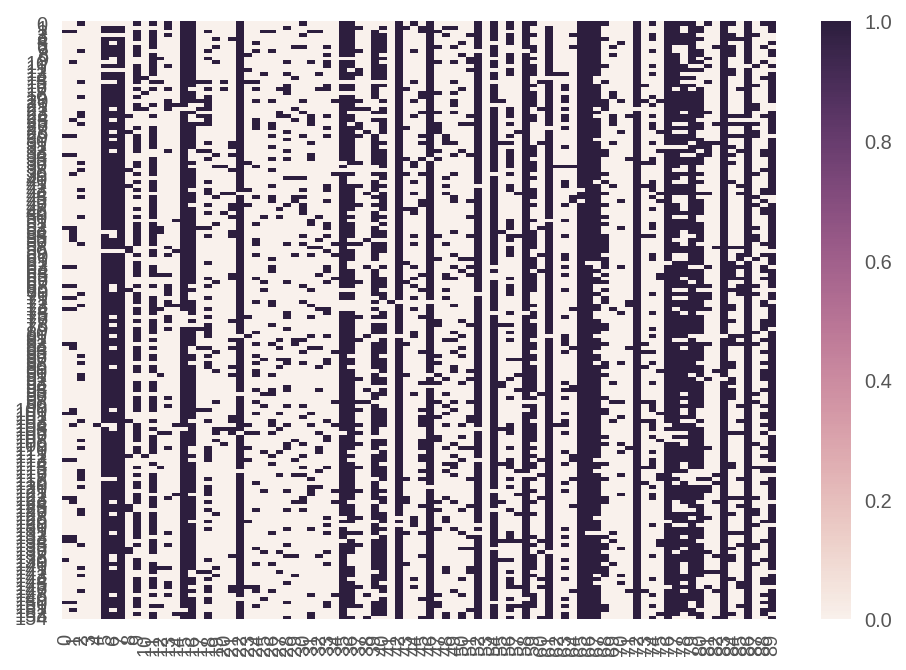

In [77]:
sns.heatmap(cluster.x[np.where(cluster.s == 813)[0]])   # TODO: functionalize

## Split-merge Gibbs sampling

In [92]:
class Cluster:
    def __init__(self, alpha, L):
        self.alpha = alpha   # concentration hyperparameter
        self.log_gamma = gammaln(self.alpha) - 2. * gammaln(0.5 * self.alpha)   # constant
        self.L = L
        
        self.base_count = np.full((2, self.L), 0., dtype=float)   # base count *without* prior
        self.ndata = 0   # cluster size
        self.log_factorial = 0.   # for calculation of Ewens
        
    def add(self, x):
        self.base_count[x, range(self.L)] += 1
        self.ndata += 1
        if self.ndata > 2:
            self.log_factorial += np.log(self.ndata - 1)
            
    def remove(self, x):
        self.base_count[x, range(self.L)] -= 1
        self.ndata -= 1
        if self.ndata > 2:
            self.log_factorial -= np.log(self.ndata)
        
    # Calculate posterior probability of this cluster
    def calculate_cluster_parameter(self):
        self.cluster_parameter = (self.base_count + 0.5 * self.alpha) / (np.sum(self.base_count, axis=0) + self.alpha)
    
    # <precomputed> == True indicates that cluster parameter is already computed
    def logp_x(self, x, precomputed=False):
        if precomputed:
            return np.sum(np.log(self.cluster_parameter[x, range(self.L)]))
        else:
            return np.sum(np.log((self.base_count[x, range(self.L)] + 0.5 * self.alpha) / (np.sum(self.base_count, axis=0) + self.alpha)))
    
    def calculate_likelihood(self, precomputed=False):
        logp = self.L * self.log_gamma   # TODO: summing for all clusters together is more efficient   # TODO: is this formula OK?

        # XXX: prior should be pevious posterior?
        
        if not precomputed:
            self.calculate_cluster_parameter()
        logp += np.sum(self.base_count * np.log(self.cluster_parameter))
        self.likelihood = logp
        

class Clustering:
    def __init__(self, data, alpha=1., start_from_one_cluster=True, n_parallel=1):
        self.n_parallel = n_parallel
        self.alpha = alpha   # concentration hyperparameter
        
        self.x = data   # observed units
        self.N, self.L = self.x.shape   # number of units and variant sites

        self.s = np.zeros(self.N, dtype=int)   # cluster assignment of x
        self.c = {}   # clusters
        
        # Information of pairs of clusters that are rejected to be merged so far
        # This is used to avoid redundant calculations of the acceptance rate
        # To add a pair:
        #    "rejected_merge_pairs[<cluster_index_1>].add(<cluster_index_2>)"
        #    "rejected_merge_pairs[<cluster_index_2>].add(<cluster_index_1>)"
        # When cluster(s) is updated:
        #    "del rejected_merge_pairs[<cluster_index>]"
        # (NOTE: data in the other side will remain forever. maybe should delete also from the other side? but it takes some time.)
        # To check whether a pair is registered:
        #    "if <cluster_index_1> in rejected_merge_pairs[<cluster_index_2>] and <cluster_index_2> in rejected_merge_pairs[<cluster_index_1>]"
        self.rejected_merge_pairs = defaultdict(set)

        if start_from_one_cluster:
            # Initial cluster assignment (all data belong to 1 cluster)
            cluster = Cluster(self.alpha, self.L)
            cluster_idx = 0
            self.c[cluster_idx] = cluster
            for i in range(self.N):
                self.c[cluster_idx].add(self.x[i])
                self.s[i] = cluster_idx
        else:
            # Another initial cluster assignment (each data belongs to each cluster)
            for i in range(self.N):
                cluster = Cluster(self.alpha, self.L)
                self.c[i] = cluster
                self.c[i].add(self.x[i])
                self.s[i] = i

        # constant used for posterior calculation
        self.log_AF = np.sum(np.log(np.array(range(self.N)) + self.alpha))
        
        # constant for new cluster generation in Gibbs sampling
        self.log_normalizer_const = gammaln(self.alpha) - gammaln(self.alpha + 1) + gammaln(0.5 * self.alpha + 1) - gammaln(0.5 * self.alpha)
        #self.log_normalizer_const = np.log(0.5)
        
        # initial cluster likelihood
        for cluster in list(self.c.values()):
            cluster.calculate_likelihood()   # cluster parameters are also calculated
            
        self.max_post = self.calculate_posterior()   # initial posterior
        self.max_s = self.s.copy()
        self.posterior_ncluster = [(self.max_post, len(self.c))]   # store posterior probability and the number of clusters for each iteration
        
    def show_clusters(self):
        for i, cluster in self.c.items():
            print(i, cluster.base_count)
        
    def calculate_posterior(self):
        # Ewens
        logp = len(self.c) * np.log(self.alpha)
        logp += sum([cluster.log_factorial for cluster in list(self.c.values())])
        logp -= self.log_AF
        
        # Cluster likelihood
        # NOTE: all cluster likelihoods should be already updated during samplings
        logp += sum([cluster.likelihood for cluster in list(self.c.values())])

        return logp
    
    def _split_merge_sampling(self, arg):
        
            original_c_idx, init_i, init_j, x_restricted, verbose = arg
            propose_type = "split" if len(original_c_idx) == 1 else "merge"
        
            if propose_type == "split":   # Split
                # NOTE: these below consist of only differences from original s and c
                s_launch = {}   # cluster assignment of x
                c_launch = {}   # clusters
                
                # Create new clusters consisting of only x[init_i] and x[init_j] respectively
                # cluster induced by init_i
                cluster = Cluster(self.alpha, self.L)
                c_idx = init_i   # temporary cluster indices by init_i and init_j, which are never same
                c_launch[c_idx] = cluster
                c_launch[c_idx].add(self.x[init_i])
                s_launch[init_i] = c_idx
                # cluster by init_j
                c_idx = init_j
                cluster = Cluster(self.alpha, self.L)
                c_launch[c_idx] = cluster
                c_launch[c_idx].add(self.x[init_j])
                s_launch[init_j] = c_idx

                c_restricted = [init_i, init_j]   # restricted (new) cluster indices for init_i and init_j
                
                if verbose:
                    print("**SPLIT** cluster %d by data %d and %d" % (original_c_idx[0], init_i, init_j))
                    #print(x_restricted)

                # Initial random assignment of each restricted data to one of the two new clusters
                #for idx in x_restricted:
                #    s_launch[idx] = random.choice(c_restricted)   # TODO: can be removed if performing the following sequential scan?
                    
                # TODO: initial assignment by the column with highest entropy
                # that is, argmin_{col} sum(col) - len(col)/2
                # or, Monte Carlo according to the relative entropy

                #if verbose:
                #    print("#INITIAL ASSIGNMENT#")
                #    print([x[1] for x in sorted(s_launch.items(), key=lambda x: x[0])])

                ## Perform restricted Gibbs sampling (first sequential scan + several random sampling) on x_resticted
                # First sequential scan (batch update at last)
                p_cluster = np.zeros((2, len(x_restricted)))   # [:, 0] for init_i, [:, 1] for init_j
                for i, c_idx in enumerate(c_restricted):
                    c_launch[c_idx].calculate_cluster_parameter()   # precompute parameters of the new clusters (consisting of only 1 data here)
                    p_cluster[i, :] = np.exp(np.array([c_launch[c_idx].logp_x(self.x[idx], precomputed=True) for idx in x_restricted]))   # single-vs-single
                p_acc_cluster = np.add.accumulate(p_cluster / np.sum(p_cluster, axis=0))

                # First assignments to one of the two clusters
                for j, idx in enumerate(x_restricted):
                    rnd = random.random()
                    for k, p in enumerate(p_acc_cluster[:, j]):
                        if p >= rnd:
                            c_idx = c_restricted[k]
                            c_launch[c_idx].add(self.x[idx])
                            s_launch[idx] = c_idx
                            break

                if verbose:
                    print("#FIRST ASSIGNMENT BY SEQUENTIAL SCAN#")
                    print([x[1] for x in sorted(s_launch.items(), key=lambda x: x[0])])
                
                # Additional Gibbs sampling
                original_cluster_size = self.c[original_c_idx[0]].ndata
                for ii in range(min([100, int(original_cluster_size * 1.5)])):   # TODO: improve this criterion
                    # Drop one (restricted) data randomly
                    r = x_restricted[random.randint(0, len(x_restricted) - 1)]
                    c_launch[s_launch[r]].remove(self.x[r])

                    # Calculate probabilities of assignment
                    logp_cluster = np.array([c_launch[c_idx].logp_x(self.x[r]) for c_idx in c_restricted])   # single-vs-single
                    p_cluster = np.exp(logp_cluster) * np.array([c_launch[c_idx].ndata for c_idx in c_restricted])
                    p_acc_cluster = np.add.accumulate(p_cluster / np.sum(p_cluster))

                    # Assignment
                    rnd = random.random()
                    for k, p in enumerate(p_acc_cluster):
                        if p >= rnd:
                            c_idx = c_restricted[k]
                            c_launch[c_idx].add(self.x[r])
                            s_launch[r] = c_idx
                            break

                    # TODO: should calculate posterior probability and select a result with highest value?

                if verbose:
                    print("#LAST ASSIGNMENT AFTER GIBBS SAMPLING#")
                    print([x[1] for x in sorted(s_launch.items(), key=lambda x: x[0])])
                
                # This precomputed cluster parameters will be used for the calculations of both q and L below
                for k in range(2):
                    c_launch[c_restricted[k]].calculate_cluster_parameter()   # Update cluster parameters of the new clusters here

                # Calculate q(c^split | c)
                logq = 0.
                for j in x_restricted:   # init_i and init_j are omitted   # TODO: is this proper?
                    k = 0 if s_launch[j] == c_restricted[0] else 1   # assigned cluster
                    c_launch[c_restricted[k]].remove(self.x[j])   # temporarily remove the data
                    # use precomputed parameter for the cluster to which the focal data below does not belong
                    logp_cluster = np.array([c_launch[c_idx].logp_x(self.x[j]) if i == k else c_launch[c_idx].logp_x(self.x[j], precomputed=True) for i, c_idx in enumerate(c_restricted)])
                    p_cluster = np.exp(logp_cluster) * np.array([c_launch[c_idx].ndata for c_idx in c_restricted])
                    logq += np.log(p_cluster[k]) - np.log(np.sum(p_cluster))
                    c_launch[c_restricted[k]].add(self.x[j])   # restore the data

                # Calculate probabilities used for acceptance ratio
                logp_transition = -logq

                logp_ewens = np.log(self.alpha)
                logp_ratio = 0.
                
                # new splitted clusters
                for c_idx in c_restricted:
                    logp_ewens += c_launch[c_idx].log_factorial
                    cluster = c_launch[c_idx]
                    cluster.calculate_likelihood(precomputed=True)   # Update likelihoods of the new clusters here
                    logp_ratio += cluster.likelihood
                    if verbose:
                        print("logp_cluster_new", c_idx, "=", cluster.likelihood)
                        
                # old single cluster
                logp_ewens -= self.c[original_c_idx[0]].log_factorial
                cluster = self.c[original_c_idx[0]]   # likelihood of the original clusters should be already calculated
                logp_ratio -= cluster.likelihood
                if verbose:
                    print("logp_cluster original =", cluster.likelihood)

            else:   # Merge
                if verbose:
                    print("**MERGE** cluster %d and %d" % (original_c_idx[0], original_c_idx[1]))
                
                if original_c_idx[0] in self.rejected_merge_pairs[original_c_idx[1]] and original_c_idx[1] in self.rejected_merge_pairs[original_c_idx[0]]:
                    # This merge proposal is previously rejected
                    if verbose:
                        print("previously rejected")
                    accepted = False
                    changes = None
                    return (accepted, changes, original_c_idx)
                
                # Set initial launch state
                #s_launch = {}
                c_launch = {}
                # We have to copy the original clusters because we perform sampling in them
                for c_idx in original_c_idx:
                    c_launch[c_idx] = copy.deepcopy(self.c[c_idx])
                
                # Calculate q(c | c^merge)
                # NOTE: parameters of the clusters to be merged should be already precomputed in the posterior update
                logq = 0.
                for j in range(self.N):
                    if j == init_i or j == init_j:   # to avoid removing these data when a cluster consists of only one of them
                        continue
                    if self.s[j] not in original_c_idx:   # filter like <x_restricted> in split
                        continue
                    k = 0 if self.s[j] == original_c_idx[0] else 1   # originally assigned cluster
                    c_launch[original_c_idx[k]].remove(self.x[j])   # temporarily remove the data
                    # use precomputed parameter for the cluster to which the focal data below does not belong
                    logp_cluster = np.array([c_launch[c_idx].logp_x(self.x[j]) if i == k else c_launch[c_idx].logp_x(self.x[j], precomputed=True) for i, c_idx in enumerate(original_c_idx)])
                    p_cluster = np.exp(logp_cluster) * np.array([c_launch[c_idx].ndata for c_idx in original_c_idx])
                    logq += np.log(p_cluster[k]) - np.log(np.sum(p_cluster))
                    c_launch[original_c_idx[k]].add(self.x[j])   # restore the data

                # Merge two clusters (index c_restricted[0] will be merged to index c_restricted[1])
                c_idx = original_c_idx[1]
                c_launch[c_idx].add(self.x[init_i])
                #s_launch[init_i] = c_idx
                for j in x_restricted:
                    if self.s[j] == original_c_idx[0]:
                        c_launch[c_idx].add(self.x[j])
                        #s_launch[j] = c_idx

                # Calculate probabilities used for acceptance ratio
                logp_transition = logq

                logp_ewens = -np.log(self.alpha)
                logp_ewens += c_launch[original_c_idx[1]].log_factorial
                for j in range(2):
                    logp_ewens -= self.c[original_c_idx[j]].log_factorial

                logp_ratio = 0.
                cluster = c_launch[original_c_idx[1]]
                cluster.calculate_likelihood()   # Update likelihood of the new cluster here; cluster parameter is also calculated
                if verbose:
                    print("logp_cluster_new", original_c_idx[1], "=", cluster.likelihood)
                logp_ratio += cluster.likelihood
                for c_idx in original_c_idx:
                    cluster = self.c[c_idx]
                    if verbose:
                        print("logp_cluster original", c_idx, "=", cluster.likelihood)
                    logp_ratio -= cluster.likelihood
                    
            # Proposal
            logp_proposal = min(0, logp_transition + logp_ewens + logp_ratio)
            if verbose:
                print(logp_proposal, "=", logp_transition, "+", logp_ewens, "+", logp_ratio)
            p_proposal = np.exp(logp_proposal)

            rnd = random.random()
            if p_proposal >= rnd:
                accepted = True
                cluster_new = [c_launch[c_idx] for c_idx in c_restricted] if propose_type == "split" else [c_launch[original_c_idx[1]]]
                if propose_type == "split":
                    x_split = [[], []]
                    for idx, c_idx in s_launch.items():   # TODO: make it more efficient
                        if c_idx == init_i:
                            x_split[0].append(idx)
                        else:
                            x_split[1].append(idx)
                else:
                    x_split = [x_restricted + [init_i, init_j]]
                changes = (cluster_new, x_split)
                if verbose:
                    print("accepted")
            else:
                accepted = False
                changes = None
                if verbose:
                    print("rejected")
                    
            return (accepted, changes, original_c_idx)
    
    def do_split_merge_sampling(self, iterations=100, verbose=False):
        logp_post = self.posterior_ncluster[-1][0]   # the last posterior
        
        for iteration in range(iterations):
            if verbose:
                print("## --- step %d --- ##" % iteration)
                print("s =", self.s)
                print("c =", list(self.c.keys()))
                
            # Calculate multiple independent proposals in parallel
            args = []
            x_remaining = set(range(self.N))
            while len(args) < self.n_parallel and len(x_remaining) >= 2:
                # Sample two distinct data
                init_i, init_j = random.sample(x_remaining, k=2)
                x_remaining.remove(init_i)
                x_remaining.remove(init_j)
                
                # NOTE: distinguish between split and merge by the length of <original_c_idx>
                if self.s[init_i] == self.s[init_j]:   # split
                    original_c_idx = [self.s[init_i]]
                else:   # merge
                    original_c_idx = [self.s[init_i], self.s[init_j]]
                    
                x_restricted = []
                for i in list(x_remaining):
                    if self.s[i] in original_c_idx:
                        x_remaining.remove(i)
                        x_restricted.append(i)
                        
                args.append((original_c_idx, init_i, init_j, x_restricted, verbose))
            
            # Reflect every accepted proposals on this launch state
            s_launch = self.s.copy()
            c_launch = copy.deepcopy(self.c)
            
            updated = False
            exe_pool = Pool(len(args))
            for accepted, changes, original_c_idx in exe_pool.imap(self._split_merge_sampling, args):
                if accepted:
                    # if split:
                    #    cluster_new = [new cluster 0 induced by init_i, new cluster 1 induced by init_j]
                    #    x_split = [[indices of x in new cluster 0], [indices of x in new cluster 1]]
                    # if merge:
                    #    cluster_new = [new merged cluster]
                    #    x_split = [x_restricted]
                    cluster_new, x_split = changes
                    
                    # Update master <c_launch> and <s_launch>
                    for i, cluster in enumerate(cluster_new):   # i = 0, 1 if split; i = 0 if merge
                        c_idx = max(list(c_launch.keys())) + 1
                        c_launch[c_idx] = cluster
                        for idx in x_split[i]:   # if merge, s_changes == [x_restricted]
                            s_launch[idx] = c_idx
                    for c_idx in original_c_idx:
                        del c_launch[c_idx]

                    # delete previously-rejected information
                    for c_idx in original_c_idx:
                        if c_idx in self.rejected_merge_pairs:
                            del self.rejected_merge_pairs[c_idx]
                                
                    updated = True
                else:
                    if len(original_c_idx) == 2:   # merge; add to previously-rejected list
                        self.rejected_merge_pairs[original_c_idx[0]].add(original_c_idx[1])
                        self.rejected_merge_pairs[original_c_idx[1]].add(original_c_idx[0])
            exe_pool.close()
                        
            if updated:   # at least one proposal was accepted
                self.c = copy.deepcopy(c_launch)
                self.s = s_launch.copy()

                logp_post = self.calculate_posterior()
                self.posterior_ncluster.append((logp_post, len(self.c)))
                if self.max_post < logp_post:   # max posterior is updated
                    self.max_post = logp_post
                    self.max_s = self.s.copy()
                    if verbose:
                        print("posterior: %f -> %f" % (self.max_post, logp_post))
            else:
                self.posterior_ncluster.append(self.posterior_ncluster[-1])
    
    def do_gibbs_sampling(self, iterations=100, verbose=False):
        logp_post = self.posterior_ncluster[-1][0]   # the last posterior
        
        for iteration in range(iterations):
            if verbose:
                print("## --- step %d --- ##" % iteration)

            # Drop 1 assignment in s
            r = random.randint(0, self.N - 1)
            out_cluster = self.s[r]
            self.c[out_cluster].remove(self.x[r])

            if self.c[out_cluster].ndata == 0:
                del self.c[out_cluster]

            # probabilities to be assigned to existing clusters
            logp_cluster = np.zeros(len(self.c.keys()) + 1)
            for i, cluster in enumerate(self.c.values()):
                if i == out_cluster:
                    logp_cluster[i] = np.log(cluster.ndata) - np.log(self.N - 1 + self.alpha) + cluster.logp_x(self.x[r])
                else:
                    logp_cluster[i] = np.log(cluster.ndata) - np.log(self.N - 1 + self.alpha) + cluster.logp_x(self.x[r], precomputed=True)

            # probability to be assigned to a new cluster
            logp_cluster[-1] = np.log(self.alpha) - np.log(self.N - 1 + self.alpha) + self.L * self.log_normalizer_const   # TODO: define as constant?

            p_cluster = np.exp(logp_cluster) / np.sum(np.exp(logp_cluster))   # normalized probabilities for assignment
            p_acc_cluster = np.add.accumulate(p_cluster)   # accumulated probabilities

            # assign new cluster based on the p
            rnd = random.random()
            for i, p in enumerate(p_acc_cluster):
                if p >= rnd:
                    if i < len(self.c):   # existing cluster
                        c_idx = list(self.c.keys())[i]
                    else:   # new cluster
                        c_idx = max(list(self.c.keys())) + 1
                        cluster = Cluster(self.alpha, self.L)
                        self.c[c_idx] = cluster
                    break
            
            self.c[c_idx].add(self.x[r])
            self.s[r] = c_idx
            
            if out_cluster != c_idx:   # dropped data is assigned to a different cluster (change in clustering)
                if verbose:
                    print("%d (%d) -> %d (%d)" % (r, self.s[r], i, c_idx), p_cluster)
                    print(self.s)
                
                # Update parameters and likelihoods of the changed clusters here
                if out_cluster in self.c:   # when not dissapeared
                    self.c[out_cluster].calculate_likelihood()
                self.c[c_idx].calculate_likelihood()
                    
                logp_post = self.calculate_posterior()
                if self.max_post < logp_post:
                    if verbose:
                        print("posterior: %f -> %f #" % (self.max_post, logp_post), self.s)
                    self.max_post = logp_post
                    self.max_s = self.s.copy()

            self.posterior_ncluster.append((logp_post, len(self.c)))
            
    def plot_transition(self, start=0, end=None, figsize=(10, 8)):
        fig, ax1 = plt.subplots(figsize=figsize)
        ax1.plot([x[0] for x in self.posterior_ncluster[start:end]], color='r')
        ax2 = ax1.twinx()
        ax2.plot([x[1] for x in self.posterior_ncluster[start:end]], color='b')
        plt.grid(False)
        plt.show()

In [58]:
def heatmap_partition(data, cluster_index, partition_width=1):
    d = np.full((data.shape[0], data.shape[1] + partition_width * (len(set(cluster_index)) + 1)), -1, dtype=int)
    start = partition_width
    for idx in set(cluster_index):
        cluster_data = data[:, np.where(cluster_index == idx)[0]]
        d[:, start:start + cluster_data.shape[1]] = cluster_data
        start += cluster_data.shape[1] + partition_width
    
    plt.subplots(figsize=(18,15))
    sns.heatmap(d, cbar=False)
    plt.show()

## Synthetic data

In [97]:
def generate_data(r, n):
    data = np.full((n, len(r)), 0, dtype=int)
    for i in range(n):
        d = r.copy()
        for j in range(len(d)):
            if d[j] == 1:
                if random.random() <= pe:
                    d[j] = 0
            elif d[j] == 0:
                if random.random() <= pe / 3:
                    d[j] = 1
        data[i, :] = d
    return data

In [98]:
r1 = []
for i in range(100):
    if random.random() < 0.3:
        r1.append(1)
    else:
        r1.append(0)
pe = 0.15
r1 = np.array(r1)

In [99]:
ndiff = 5

r2 = r1.copy()
r2[10:10+ndiff] = 1 - r1[10:10+ndiff]
r3 = r1.copy()
r3[50:50+ndiff] = 1 - r1[50:50+ndiff]

In [100]:
data = np.concatenate((generate_data(r1, 100), generate_data(r2, 50), generate_data(r3, 50)), axis = 0)

In [85]:
data.shape

(200, 100)

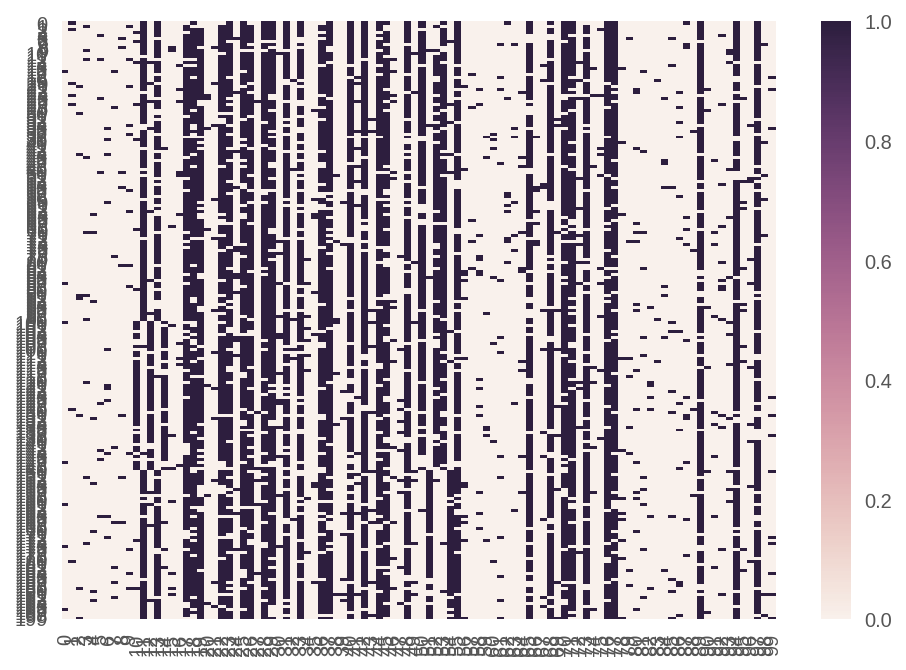

In [86]:
sns.heatmap(data)

In [92]:
# Reload module
import dpmm
importlib.reload(dpmm)
from dpmm import *

In [101]:
clustering = Clustering(data, 1.0, 1, verbose=False)

In [102]:
run_sampling(clustering, "both", 10000, converge_threshold_sm=1000, converge_threshold_gibbs=1000, out_cluster_pickle="hoge.pkl")

[INFO] SM converged at 1084 iterations
[INFO] Gibbs converged at 3942 iterations
[INFO] Finished in 11.788136 second


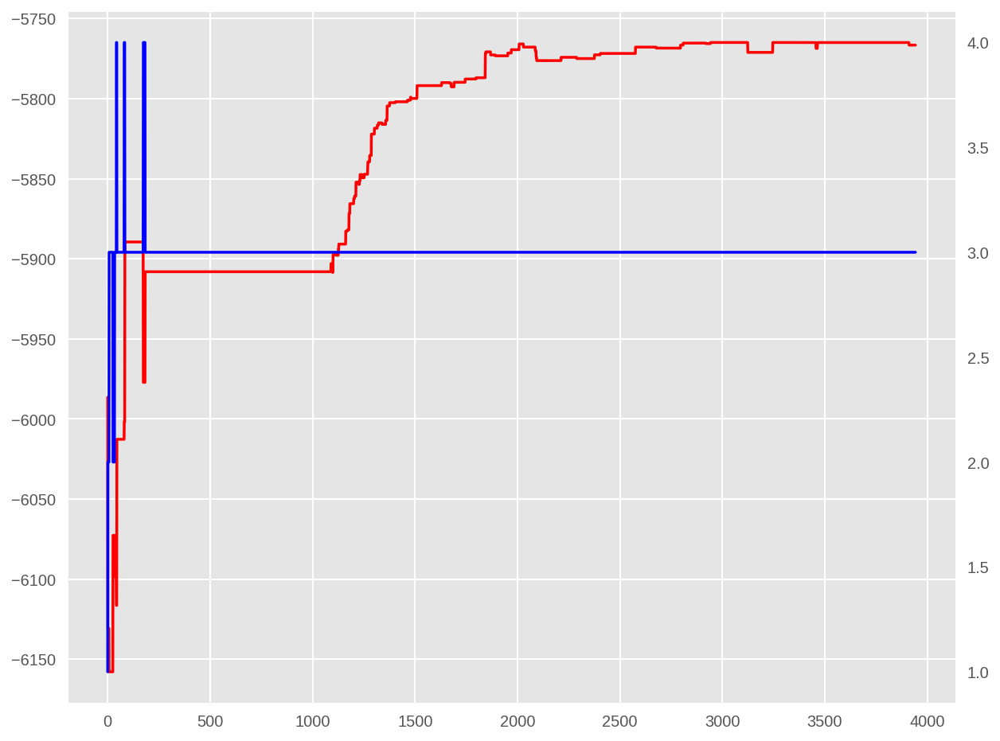

In [103]:
clustering.plot_transition()

In [104]:
clustering.max_s

array([15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 16, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16,
       16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16,
       16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16,
       16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 12, 12, 12,
       12, 15, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
       12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
       12, 12, 12, 12, 12, 12, 12, 12, 15, 12, 12, 12, 12])

In [48]:
test = Clustering(data=data, n_parallel=2)

In [49]:
test.do_split_merge_sampling(iterations=10, verbose=False)

## --- step 0 --- ##
s = [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
c = [0]
**SPLIT** cluster 0 by data 95 and 56
#FIRST ASSIGNMENT BY SEQUENTIAL SCAN#
[56, 95, 56, 56, 56, 56, 56, 56, 56, 95, 95, 56, 56, 95, 56, 56, 56, 56, 56, 56, 95, 56, 56, 56, 95, 95, 56, 56, 95, 56, 56, 56, 56, 56, 56, 95, 56, 56, 56, 56, 95, 56, 56, 95, 95, 95, 95, 56, 95, 56, 56, 56, 56, 95, 56, 56, 56, 56, 56, 56, 56, 56, 56, 95, 56, 95, 56, 56, 56, 56, 95, 56, 56, 56, 56, 95, 56, 95, 56, 56, 95, 95, 95, 56, 56, 56, 56, 56, 56, 95, 56, 56, 56, 56, 56, 95, 56, 56, 56, 56, 56, 56, 56, 56, 95, 95, 56, 95, 56, 56, 56, 56, 95, 56, 56, 56, 56, 56, 56, 56, 95,

logp_cluster_new 103 = -1028.02812888
logp_cluster_new 117 = -168.305371152
logp_cluster original = -1094.169347
-94.849525065 = 13.9739218853 + -6.65929391968 + -102.164153031
rejected
posterior: -5481.847232 -> -5481.847232
## --- step 5 --- ##
s = [7 7 7 6 7 7 7 3 7 7 7 7 7 6 3 6 7 6 7 7 7 7 7 7 7 7 7 7 7 7 7 7 3 7 3 7 7
 7 7 7 7 7 7 6 7 7 6 7 7 3 7 7 3 7 7 7 7 7 7 7 7 7 7 7 3 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 6 7 7 3 7 7 7 7 7 7 7 7 7 7 3 3 7 3 7 7 3 7 3 3 3
 3 7 3 3 3 3 3 3 3 3 7 3 7 3 7 3 3 3 3 3 3 3 3 3 3 3 3 7 7 3 7 3 7 3 7 7 7
 7 7 6 7 6 7 7 6 6 7 6 6 6 7 6 7 6 6 7 6 6 6 6 6 6 7 6 6 6 6 6 7 6 6 6 6 6
 7 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
c = [3, 6, 7]
**SPLIT** cluster 7 by data 67 and 154
**MERGE** cluster 3 and 6
#FIRST ASSIGNMENT BY SEQUENTIAL SCAN#
[67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 154, 67, 67, 67, 67, 67, 154, 67, 67, 67, 67, 67, 67, 67, 67, 154, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 154, 67, 154, 67, 67, 67, 67, 67, 67, 67, 67,

logp_cluster original = -2969.52159891
-77.8012468736 = 12.5585531619 + -12.0219169077 + -78.3378831278
rejected
## --- step 9 --- ##
s = [7 7 7 6 7 7 7 3 7 7 7 7 7 6 3 6 7 6 7 7 7 7 7 7 7 7 7 7 7 7 7 7 3 7 3 7 7
 7 7 7 7 7 7 6 7 7 6 7 7 3 7 7 3 7 7 7 7 7 7 7 7 7 7 7 3 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 6 7 7 3 7 7 7 7 7 7 7 7 7 7 3 3 7 3 7 7 3 7 3 3 3
 3 7 3 3 3 3 3 3 3 3 7 3 7 3 7 3 3 3 3 3 3 3 3 3 3 3 3 7 7 3 7 3 7 3 7 7 7
 7 7 6 7 6 7 7 6 6 7 6 6 6 7 6 7 6 6 7 6 6 6 6 6 6 7 6 6 6 6 6 7 6 6 6 6 6
 7 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
c = [3, 6, 7]
**MERGE** cluster 3 and 7
**SPLIT** cluster 6 by data 152 and 190
#FIRST ASSIGNMENT BY SEQUENTIAL SCAN#
[152, 152, 152, 152, 152, 152, 152, 152, 152, 190, 152, 190, 152, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 152, 152, 190, 190, 190, 152, 190, 190, 190, 190, 152, 152, 190, 190, 190, 190, 152, 190, 152, 152, 190, 190, 152, 152]
logp_cluster_new 7 = -4115.8626344
logp_cluster original 3 = -1094.169347
logp_cluster original 7 = -

In [42]:
test.do_gibbs_sampling(iterations=1000, verbose=False)

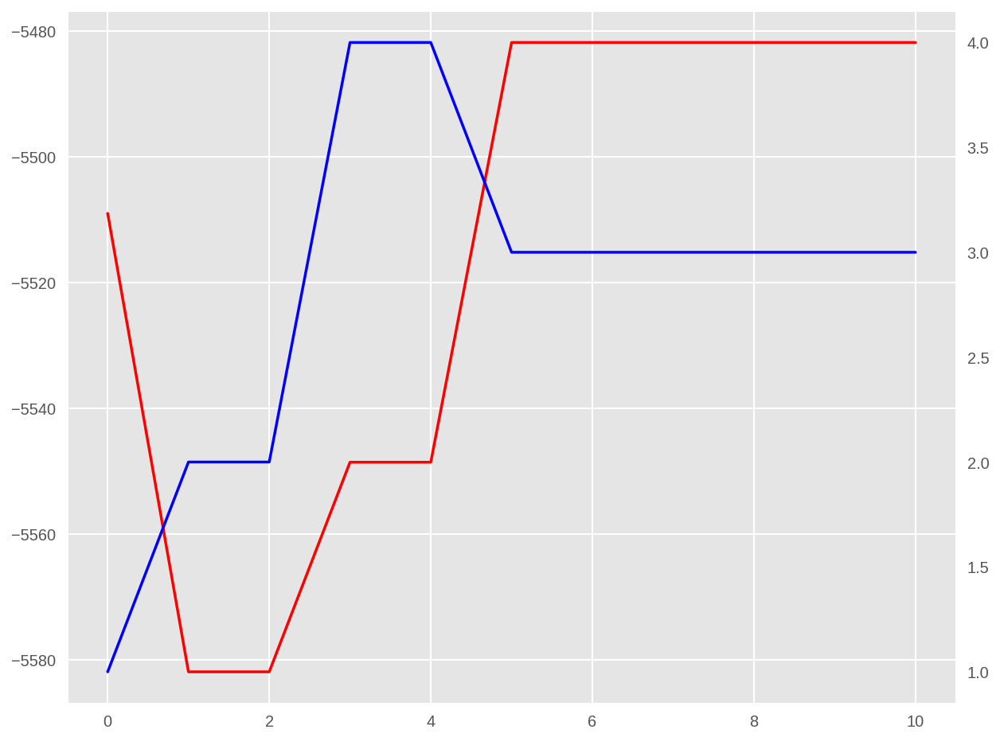

In [50]:
test.plot_transition(figsize=(10,8))

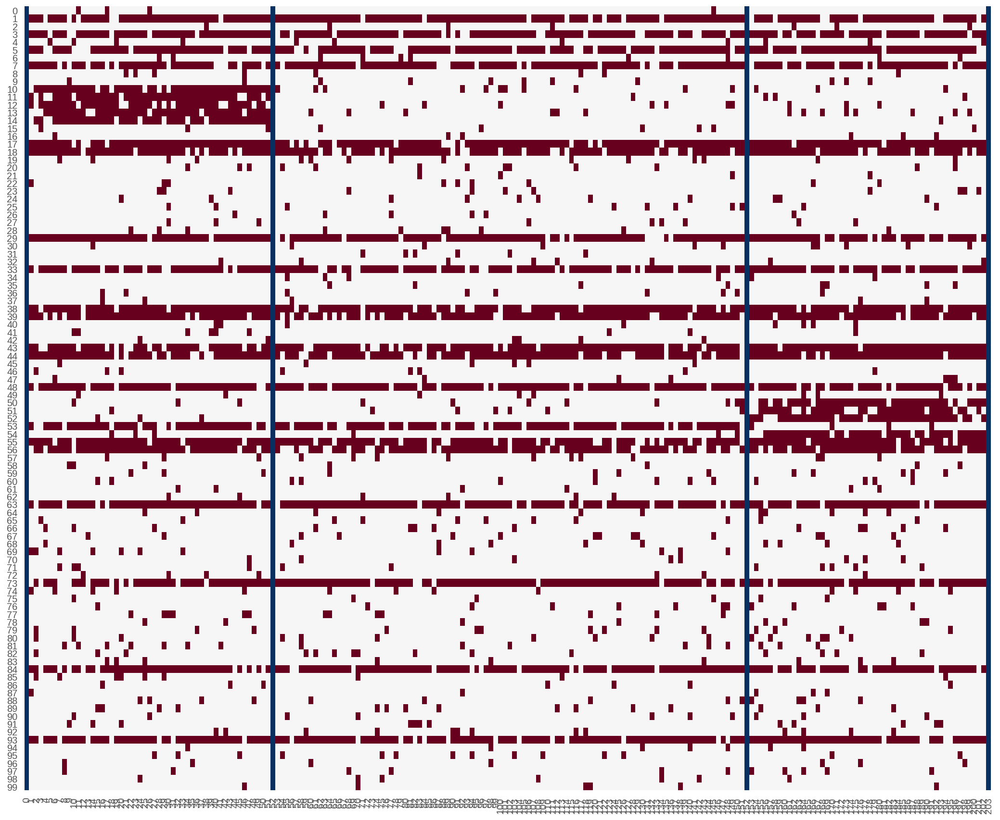

In [44]:
heatmap_partition(test.x.T, test.max_s)

## Real data

In [4]:
v = np.full((93, 888), 93, dtype=int)   # TODO: why discrepancy between len(out_seqs ) and width of consed output?

root_dir = "/home/ysuzuki/work/RepeatAssembly/datruf_run/dmel/backup/"
with open('%speak_small/peak.3.unit.1.seqs.V' % (root_dir), 'r') as f:
    for i, line in enumerate(f):
        v[i, :] = list(map(int, list(line.strip())))

data = v.T

In [5]:
data.shape

(888, 93)

#### 1 parallel

In [37]:
real = Clustering(data=data, n_parallel=1)

In [38]:
t0 = time.time()
real.do_split_merge_sampling(iterations=50000, verbose=False)
t1 = time.time()
t1 - t0

1432.009506702423

In [46]:
real.do_gibbs_sampling(iterations=300000, verbose=False)

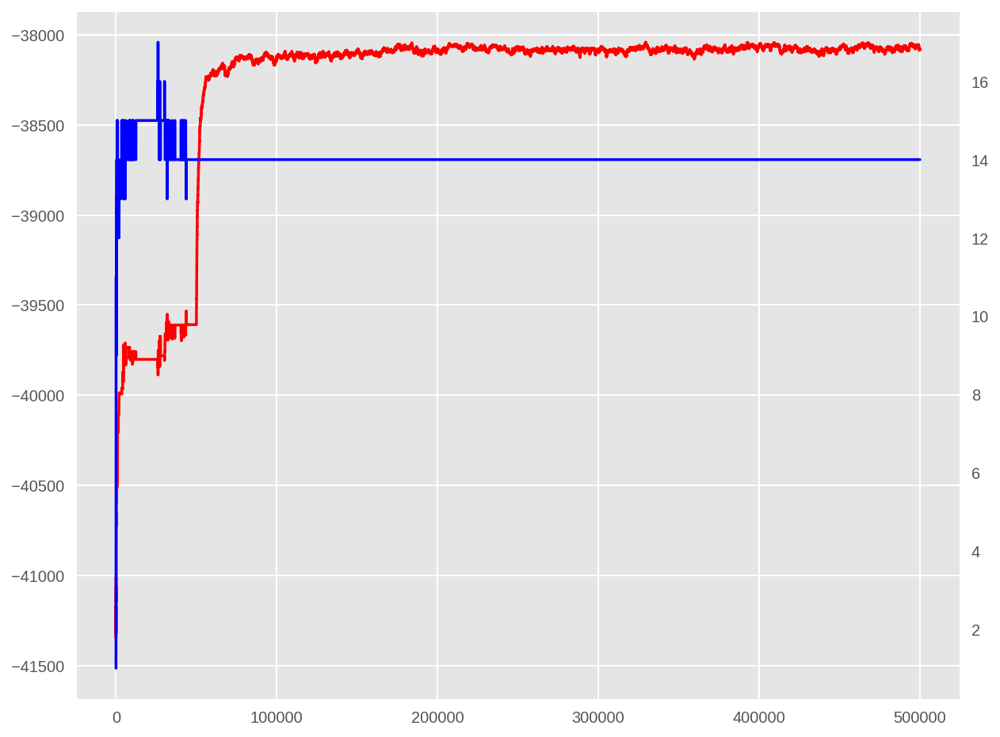

In [47]:
real.plot_transition(figsize=(10,8))

In [48]:
real.max_s

array([178, 178, 178, 178, 158, 216, 158, 158, 158, 224, 169, 194, 194,
       158, 194,  89,  89, 178, 178, 178, 178, 178, 178, 178, 178, 178,
       178, 178, 178, 178, 178, 129, 169, 138, 169,  93,  81, 129, 158,
       224,  81, 169,  81, 129, 158,  93, 158, 129, 216, 158, 169, 129,
        81, 216, 158, 158, 129, 158, 129, 129, 129, 169,  81, 158,  81,
        93, 223, 158, 224, 158, 158, 194, 158, 158,  93, 158,  93, 216,
        93, 223, 138,  93, 216, 216, 158, 223, 223, 158, 223, 223, 223,
       158, 223, 158, 178, 178, 129, 129, 216, 158, 169, 169, 216, 224,
       216, 194, 216, 158, 194, 158, 158, 158, 138, 169, 169, 158, 216,
       158, 223, 138,  81, 194,  81, 169, 194, 169,  81,  81,  93, 158,
       224, 223, 223, 223, 223, 223, 223, 223, 223, 138,  93, 138,  93,
       158,  93, 224, 224, 138, 216, 194,  93,  93, 194,  93,  93, 216,
       194, 158,  93,  93,  93, 158, 194,  93,  93, 194,  93, 194,  93,
       129, 169, 158, 216, 158, 216, 158, 223, 223, 158, 224, 22

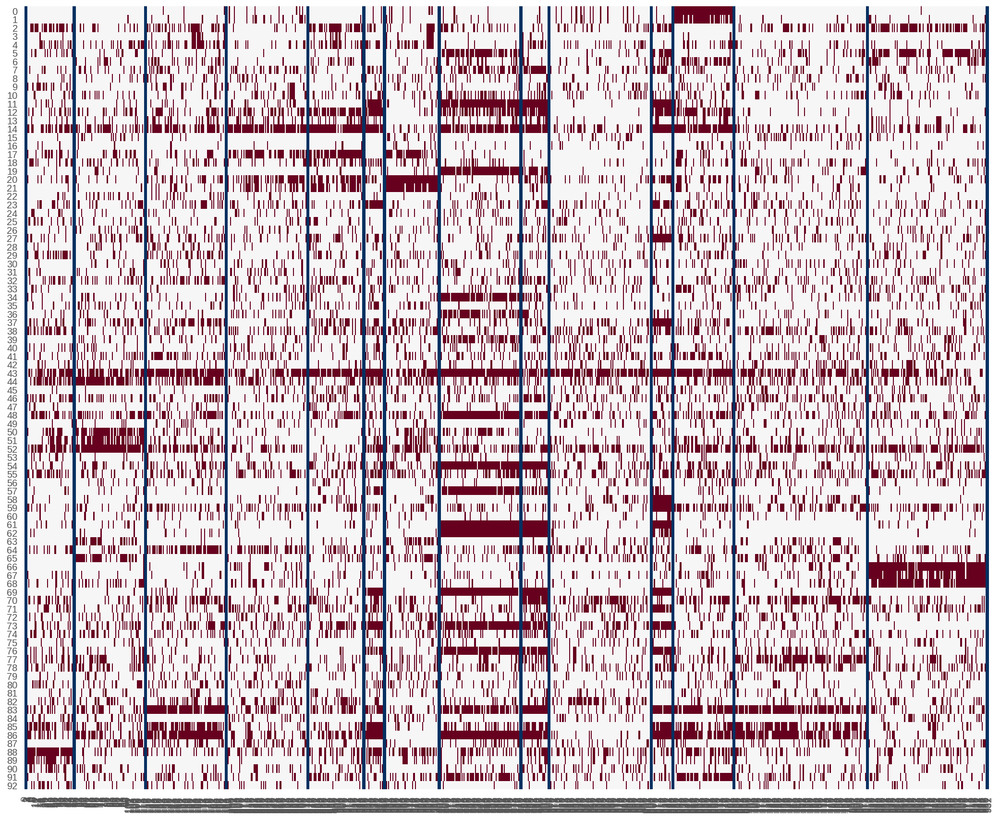

In [49]:
heatmap_partition(real.x.T, real.max_s, partition_width=3)

#### 24 parallel

In [5]:
real = Clustering(data=data, n_parallel=24)

In [6]:
t0 = time.time()
real.do_split_merge_sampling(iterations=10000, verbose=False)
t1 = time.time()
t1 - t0

1083.3691413402557

In [31]:
real.do_gibbs_sampling(iterations=500000, verbose=False)

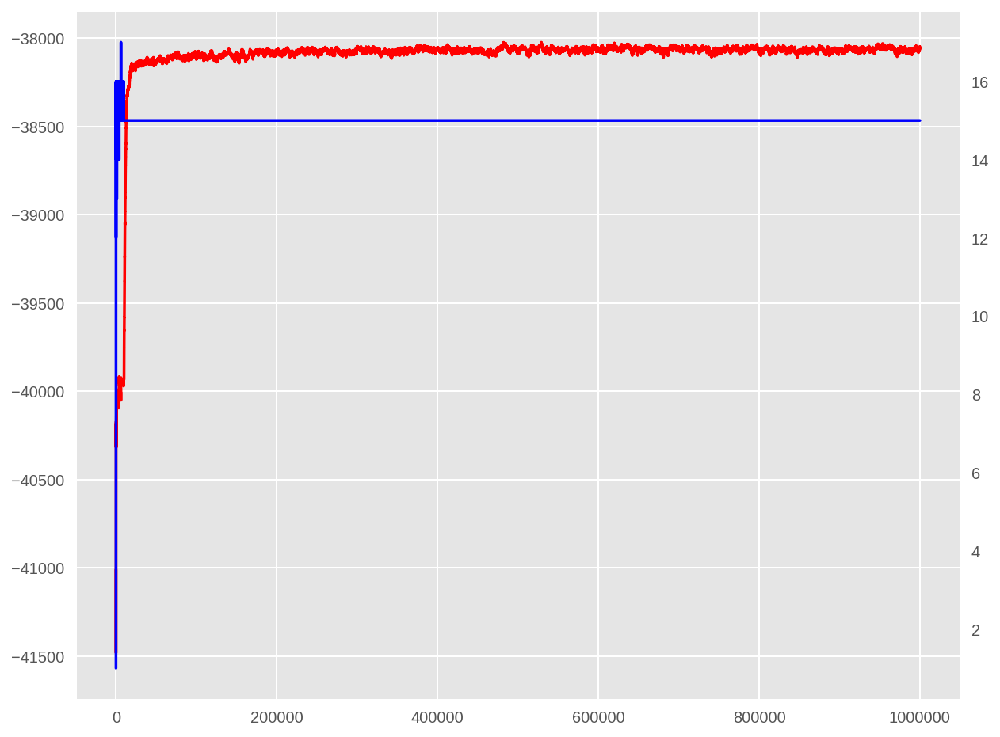

In [32]:
real.plot_transition(figsize=(10,8))

In [33]:
real.posterior_ncluster[-1]

(-38060.850053421833, 15)

In [34]:
real.max_post

-38023.477998463888

In [35]:
real.max_s

array([140, 133, 133, 133, 198, 163, 165, 198, 165, 198, 198, 216, 216,
       165, 216,  25,  25, 133, 133, 133, 133, 133, 133, 133, 133, 133,
       133, 133, 133, 133, 133, 143, 215, 215, 222,  95, 247, 143, 165,
       198, 247, 222, 247, 143, 165, 165, 165, 143, 198, 163, 222, 163,
       247, 163, 163, 198, 143, 165, 143, 143, 143, 215, 247, 165, 247,
        95, 226, 165, 198, 165, 165, 216, 165, 216,  95, 165,  95, 165,
        95, 225, 215,  95, 163, 225, 165, 226, 226, 165, 226, 226, 226,
       165, 226, 165, 133, 133, 216, 143, 198, 165, 222, 163, 163, 198,
       163, 216, 163, 165, 216, 165, 165, 247, 215, 222, 198, 165, 225,
       165, 226, 215, 247, 216, 247, 198, 216, 198, 247, 247, 225, 165,
       198, 226, 226, 226, 226, 226, 226, 226, 226, 215,  95, 215,  95,
       198,  95, 198, 198, 215, 163, 216,  95,  95, 198,  95,  95, 163,
       216, 165,  95,  95, 216, 165, 216,  95,  95, 216,  95, 222,  95,
       143, 222, 165, 198, 198, 198, 216, 226, 226, 165, 216, 22

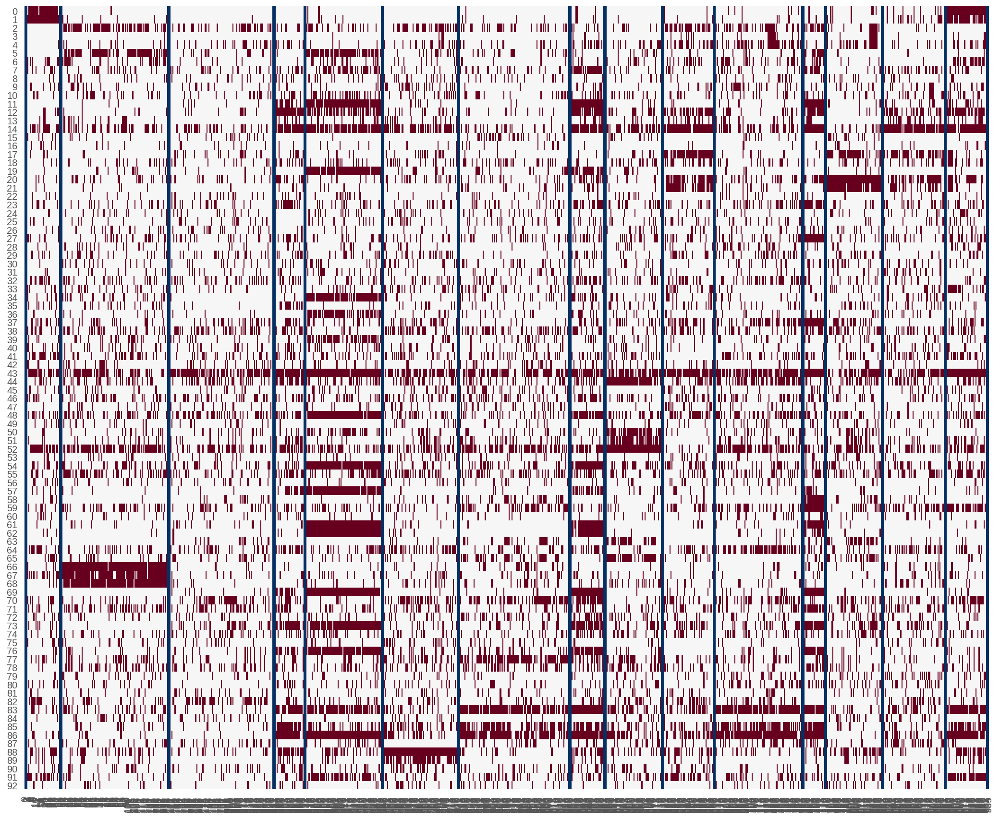

In [36]:
heatmap_partition(real.x.T, real.max_s, partition_width=3)

### previous result

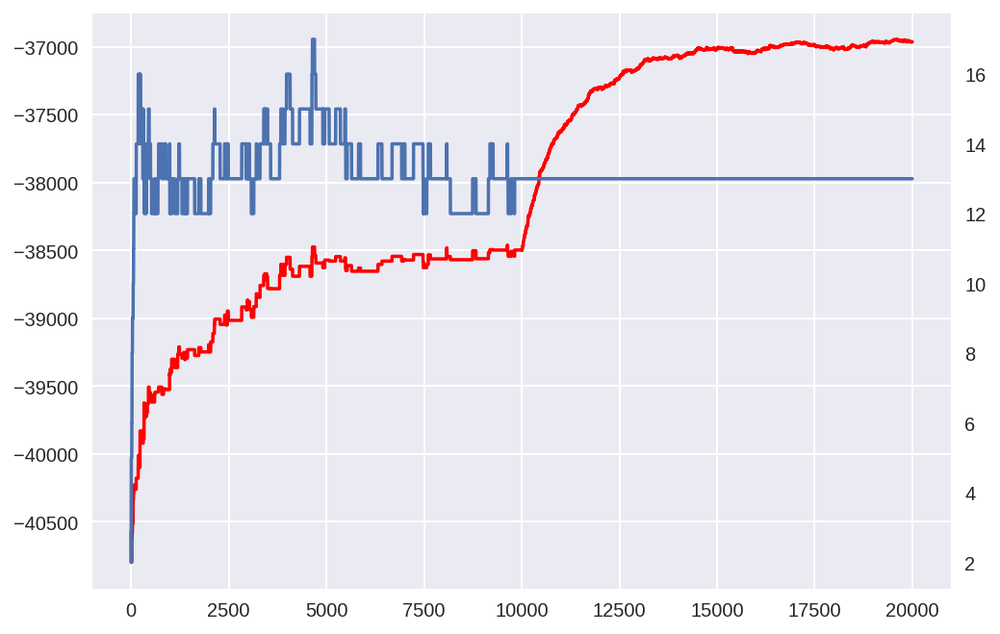

In [205]:
fig, ax1 = plt.subplots()
ax1.plot([x[0] for x in post_ncluster[0:20000]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[0:20000]])
plt.grid(False)
plt.show()

~10000 iterations: split-merge MCMC (MH + local Gibbs sampling), 10000~40000 iterations: Gibbs sampling

In [203]:
max_s

array([116, 116, 116, 116, 154, 150, 154, 154, 154, 155, 155, 141, 154,
       154, 154, 106, 106, 116, 116, 116, 116, 116, 116, 116, 116, 116,
       116, 116, 116, 116, 116, 110, 155, 155, 150,  89, 156, 110, 110,
       150, 156, 141, 156, 110, 154, 154, 154, 110, 154, 150, 150, 110,
       156, 110, 150, 150, 110, 110, 110, 110, 110, 155, 156, 155, 155,
       155, 127, 154, 150, 154, 154, 155, 154, 154, 155, 154, 155, 154,
       155, 127, 155, 155, 150, 127, 150, 146, 146, 154, 146, 146, 146,
       154, 146, 154, 116, 116, 141, 110, 150, 110, 127, 150, 150, 154,
       150, 141, 150, 154, 141, 154, 154, 150, 155, 155, 150, 154, 127,
       154, 154, 141, 155, 141, 156, 155, 154, 150, 156, 150, 155, 154,
       150, 146, 146, 146, 146, 146, 146, 146, 146, 155,  89, 155,  89,
       154,  89, 150, 154, 141, 150, 141, 155,  89, 141,  89, 154, 150,
       141, 154,  89,  89,  89, 154, 141,  89,  89, 141,  89, 141,  89,
       150, 150, 154, 150, 154, 150, 154, 146, 146, 154, 154, 14

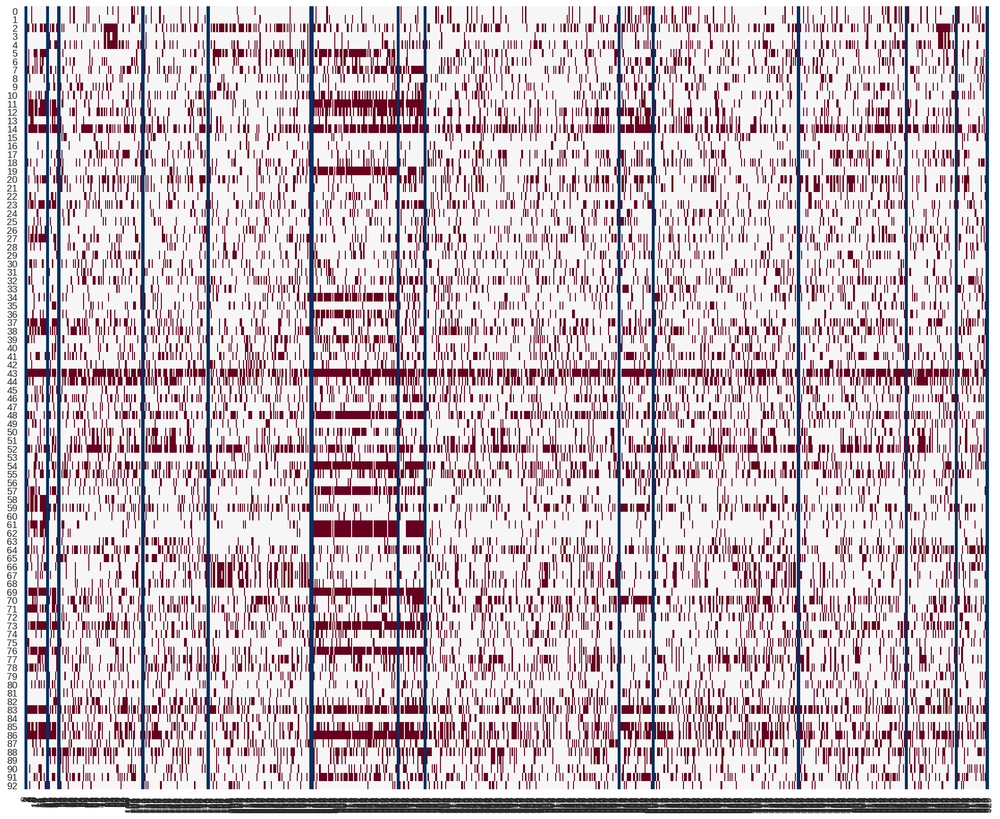

In [204]:
heatmap_partition(v, max_s, partition_width=3)

## Large real data

In [56]:
from dacenter_run import *

In [5]:
# Reload module
import dacenter_run
importlib.reload(dacenter_run)
from dacenter_run import *

In [57]:
root_dir = "/home/ysuzuki/work/RepeatAssembly/datruf_run/dmel/"
vmatrix = load_vmatrix(root_dir + "backup/peak/peak.3.unit.1.seqs.V")

In [62]:
large = Clustering(data=vmatrix)

In [63]:
t0 = time.time()
large.do_split_merge_sampling(iterations=10, verbose=True)
t1 = time.time()
t1 - t0

## --- step 0 --- ##
s = [0 0 0 ..., 0 0 0]
c = [0]
**SPLIT** cluster 0 by data 1090 and 2201
#FIRST ASSIGNMENT BY SEQUENTIAL SCAN#
[2201, 2201, 2201, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 2201, 2201, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 1090, 109

#LAST ASSIGNMENT AFTER GIBBS SAMPLING#
[2201, 2201, 2201, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 2201, 2201, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 2201, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 

logp_cluster_new 1090 = -353211.210745
logp_cluster_new 2201 = -115939.155065
logp_cluster original = -518685.785147
0 = 2054.81899688 + -6334.55425809 + 49535.4193371
accepted
posterior: -475494.284073 -> -475494.284073
## --- step 1 --- ##
s = [2 2 2 ..., 1 1 1]
c = [1, 2]
**SPLIT** cluster 1 by data 11303 and 7795
#FIRST ASSIGNMENT BY SEQUENTIAL SCAN#
[7795, 11303, 7795, 7795, 7795, 7795, 7795, 11303, 7795, 7795, 7795, 7795, 11303, 7795, 11303, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 11303, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 11303, 7795, 7795, 7795, 11303, 11303, 7795, 11303, 11303, 7795, 7795, 7795, 7795, 11303, 7795, 7795, 7795, 7795, 7795, 11303, 11303, 11303, 11303, 11303, 11303, 7795, 11303, 11303, 7795, 11303, 11303, 11303, 7795, 11303, 11303, 11303, 11303, 11303, 7795, 7795, 11303, 7795, 7795, 11303, 11303, 11303, 11303, 7795, 11303, 11303, 11303, 11303, 7795, 11303, 7795, 7795, 7795, 11303, 11303, 7795, 7795, 7795, 7795, 7795, 7795, 11303, 11303, 11303, 

#LAST ASSIGNMENT AFTER GIBBS SAMPLING#
[7795, 11303, 7795, 7795, 7795, 7795, 7795, 11303, 7795, 7795, 7795, 7795, 11303, 7795, 11303, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 11303, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 11303, 7795, 7795, 7795, 11303, 11303, 7795, 11303, 11303, 7795, 7795, 7795, 7795, 11303, 7795, 7795, 7795, 7795, 7795, 11303, 11303, 11303, 11303, 11303, 11303, 7795, 11303, 11303, 7795, 11303, 11303, 11303, 7795, 11303, 11303, 11303, 11303, 11303, 7795, 7795, 11303, 7795, 7795, 11303, 11303, 11303, 11303, 7795, 11303, 11303, 11303, 11303, 7795, 11303, 7795, 7795, 7795, 11303, 11303, 7795, 7795, 7795, 7795, 7795, 7795, 11303, 11303, 11303, 11303, 7795, 11303, 7795, 11303, 11303, 7795, 7795, 11303, 7795, 7795, 7795, 7795, 11303, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 11303, 7795, 11303, 7795, 11303, 11303, 7795, 11303, 7795, 11303, 11303, 7795, 11303, 11303, 7795, 11303, 7795, 7795, 11303, 7795, 11303, 11303, 7795, 11303, 1130

logp_cluster_new 11303 = -161512.980156
logp_cluster_new 7795 = -187221.328593
logp_cluster original = -353211.210745
0 = 4648.02191391 + -6173.29632585 + 4476.90199589
accepted
## --- step 2 --- ##
s = [2 2 2 ..., 4 3 4]
c = [2, 3, 4]
**MERGE** cluster 4 and 3
logp_cluster_new 3 = -353211.210745
logp_cluster original 4 = -187221.328593
logp_cluster original 3 = -161512.980156
-2951.55517404 = -4647.949504 + 6173.29632585 + -4476.90199589
rejected
## --- step 3 --- ##
s = [2 2 2 ..., 4 3 4]
c = [2, 3, 4]
**MERGE** cluster 4 and 2
logp_cluster_new 2 = -343847.552333
logp_cluster original 4 = -187221.328593
logp_cluster original 2 = -115939.155065
-37146.5356669 = -1393.80017544 + 4934.33318371 + -40687.0686752
rejected
## --- step 4 --- ##
s = [2 2 2 ..., 4 3 4]
c = [2, 3, 4]
**MERGE** cluster 2 and 3
logp_cluster_new 3 = -316434.28868
logp_cluster original 2 = -115939.155065
logp_cluster original 3 = -161512.980156
-35037.7515059 = -650.834497359 + 4595.23645082 + -38982.1534593
reject

#LAST ASSIGNMENT AFTER GIBBS SAMPLING#
[11644, 11644, 571, 11644, 11644, 11644, 571, 571, 11644, 571, 11644, 571, 571, 571, 11644, 571, 11644, 11644, 11644, 11644, 571, 571, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 571, 11644, 11644, 11644, 11644, 571, 11644, 571, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 571, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 571, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 571, 571, 11644, 11644, 11644, 11644, 571, 11644, 11644, 11644, 11644, 11644, 11644, 571, 11644, 11644, 11644, 11644, 571, 11644, 571, 11644, 11644, 571, 11644, 11644, 11644, 571, 571, 11644, 571, 571, 571, 11644, 11644, 11644, 11644, 571, 11644, 11644, 11644, 11644, 571, 11644, 571, 11644, 11644, 11644, 571, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 11644, 

logp_cluster_new 11644 = -152202.52899
logp_cluster_new 571 = -33741.5545043
logp_cluster original = -187221.328593
0 = 1849.6405252 + -2232.04932897 + 1277.24509906
accepted
## --- step 7 --- ##
s = [2 2 2 ..., 5 3 5]
c = [2, 3, 5, 6]
**MERGE** cluster 2 and 5
logp_cluster_new 5 = -307464.087242
logp_cluster original 2 = -115939.155065
logp_cluster original 5 = -152202.52899
-35620.132816 = -828.281975111 + 4530.55234599 + -39322.4031869
rejected
## --- step 8 --- ##
s = [2 2 2 ..., 5 3 5]
c = [2, 3, 5, 6]
**SPLIT** cluster 3 by data 1426 and 4047
#FIRST ASSIGNMENT BY SEQUENTIAL SCAN#
[4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 1426, 4047, 1426, 4047, 4047, 1426, 1426, 1426, 4047, 1426, 4047, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 1426, 4047, 4047, 4047, 1426

#LAST ASSIGNMENT AFTER GIBBS SAMPLING#
[4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 1426, 4047, 1426, 4047, 4047, 1426, 1426, 1426, 4047, 1426, 4047, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 1426, 4047, 4047, 4047, 1426, 1426, 1426, 1426, 1426, 4047, 1426, 1426, 1426, 4047, 4047, 4047, 1426, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 1426, 1426, 1426, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 4047, 1426, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 4047, 1426, 1426, 1426, 4047, 1426, 4047, 4047, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 1426, 4047, 1426, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 4047, 1426, 4047, 4047, 4047, 1426, 4047, 1426, 1426, 4047, 

logp_cluster_new 1426 = -38128.1592135
logp_cluster_new 4047 = -120617.022985
logp_cluster original = -161512.980156
0 = 1953.67540343 + -2267.08291983 + 2767.79795774
accepted
## --- step 9 --- ##
s = [2 2 2 ..., 5 8 5]
c = [2, 5, 6, 7, 8]
**SPLIT** cluster 5 by data 600 and 3990
#FIRST ASSIGNMENT BY SEQUENTIAL SCAN#
[3990, 600, 3990, 3990, 600, 600, 3990, 3990, 3990, 3990, 3990, 600, 600, 3990, 3990, 3990, 3990, 3990, 600, 3990, 600, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 600, 3990, 3990, 600, 3990, 3990, 600, 600, 600, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 600, 600, 3990, 3990, 3990, 3990, 3990, 600, 3990, 600, 3990, 3990, 3990, 3990, 600, 3990, 3990, 3990, 600, 3990, 600, 3990, 3990, 3990, 3990, 600, 3990, 3990, 3990, 600, 3990, 3990, 600, 600, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 600, 3990, 3990, 3990, 3990, 3990, 600, 600, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 600, 3990, 3990, 3990, 3990, 3990, 3990

#LAST ASSIGNMENT AFTER GIBBS SAMPLING#
[3990, 600, 3990, 3990, 600, 600, 3990, 3990, 3990, 3990, 3990, 600, 600, 3990, 3990, 3990, 3990, 3990, 600, 3990, 600, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 600, 3990, 3990, 600, 3990, 3990, 600, 600, 600, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 600, 600, 3990, 3990, 3990, 3990, 3990, 600, 3990, 600, 3990, 3990, 3990, 3990, 600, 3990, 3990, 3990, 600, 3990, 600, 3990, 3990, 3990, 3990, 600, 3990, 3990, 3990, 600, 3990, 3990, 600, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 600, 3990, 3990, 3990, 3990, 3990, 600, 600, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 600, 600, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 600, 3990, 3990, 3990, 3990, 3990, 600, 3990, 3990, 3990, 3990, 3990, 600, 3990, 600, 600, 3990, 3990, 3990, 600, 3990, 3990, 3990, 3990, 600, 3990, 3990, 3990, 3990, 600, 3990, 600, 3990, 600, 3990, 3990, 3990, 3990, 3990, 3990, 3990, 600, 3990, 39

logp_cluster_new 600 = -27667.1840584
logp_cluster_new 3990 = -123279.781172
logp_cluster original = -152202.52899
0 = 1016.16816034 + -1853.49776514 + 1255.56375946
accepted


18.533649682998657

In [ ]:
large.do_gibbs_sampling(iterations=100000, verbose=False)

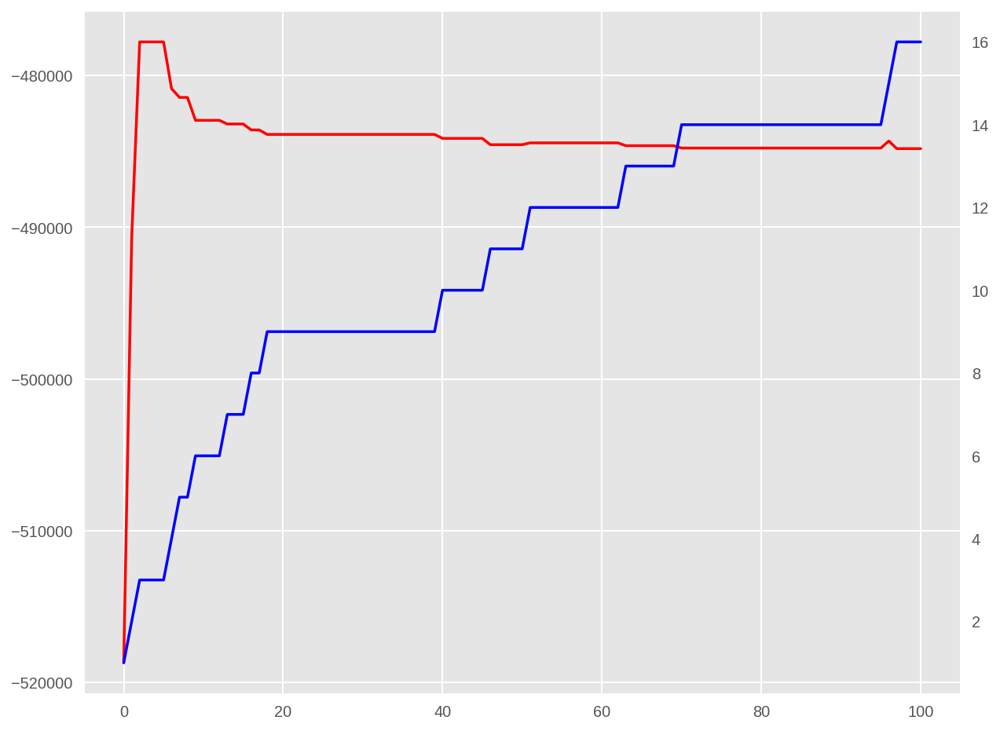

In [60]:
large.plot_transition(figsize=(10,8))

In [61]:
large.posterior_ncluster

[(-518695.14915209881, 1),
 (-490693.54447425157, 2),
 (-477782.60686900467, 3),
 (-477782.60686900467, 3),
 (-477782.60686900467, 3),
 (-477782.60686900467, 3),
 (-480860.62075513374, 4),
 (-481441.66781989287, 5),
 (-481441.66781989287, 5),
 (-482950.76774688007, 6),
 (-482950.76774688007, 6),
 (-482950.76774688007, 6),
 (-482950.76774688007, 6),
 (-483192.93246115826, 7),
 (-483192.93246115826, 7),
 (-483192.93246115826, 7),
 (-483584.73710990278, 8),
 (-483584.73710990278, 8),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 (-483878.96219050844, 9),
 

In [14]:
large.max_s[:1000]

array([26, 26, 26, 17, 12, 19, 20, 17, 15, 28,  8, 23, 26, 26, 26, 26, 26,
       26, 26, 26,  8, 26, 26,  8, 27, 17, 22,  9,  8, 15, 12, 28, 28, 14,
       17, 27, 24, 14, 24, 22, 28, 12, 14, 17, 12,  9, 24, 24, 28, 24, 12,
       17, 24, 23, 17, 24, 27, 24, 12, 27, 14,  8, 26, 15, 14, 24, 28, 28,
       17, 20, 23, 28, 17, 28, 14, 23, 17, 28, 28, 28, 12, 28,  9, 24, 27,
       24, 27, 23, 14, 12, 17,  9,  8, 17, 27, 17,  8, 12,  9,  8, 19, 24,
       22, 28, 14, 17, 14, 15, 19, 23, 12, 14, 12, 12, 27, 12, 12, 14, 22,
        9,  9, 28,  9, 27, 22, 19, 27, 26, 26, 26, 26, 26, 26, 26,  8,  8,
        8, 26, 26, 26, 26, 26, 20, 22, 22, 22, 28, 24, 28, 15, 17, 20, 17,
       22, 28, 14, 17, 15, 28, 14, 27, 17, 15, 22,  8, 23, 14, 27, 14, 27,
       27, 19, 27, 27, 12,  9,  9,  9,  9,  8,  9,  9, 17, 19, 12,  9, 22,
       28, 17, 24, 12, 20, 27, 12, 24, 28, 24, 17, 23,  9, 14, 17,  9, 12,
       22, 14, 12,  8, 28, 15, 15, 24, 15, 15, 15, 19, 20, 15, 20, 20, 14,
        8, 25,  8,  8,  8

### previous result

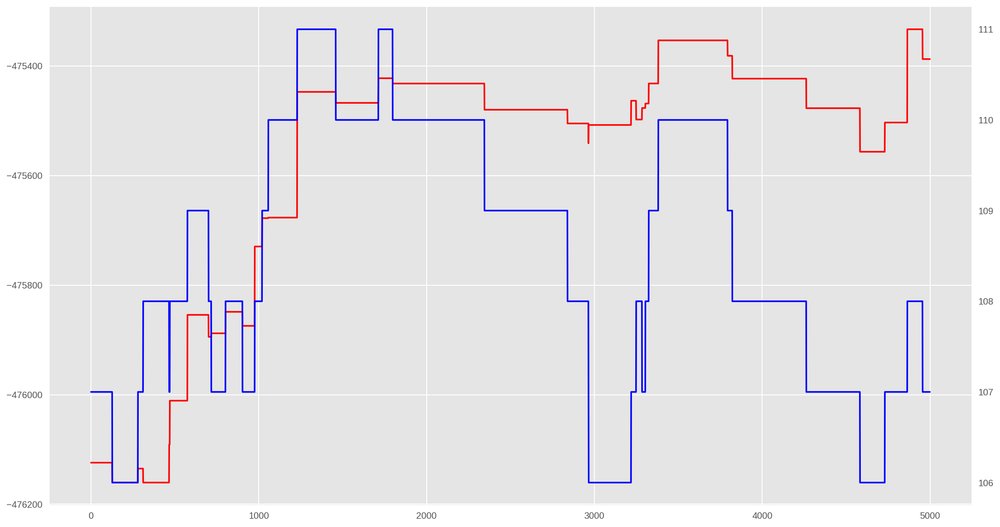

In [73]:
fig, ax1 = plt.subplots(figsize=(18, 10))
ax1.plot([x[0] for x in post_ncluster[40000:]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[40000:]], color='b')
plt.grid(False)
plt.show()

In [72]:
max_s[:1000]

array([372, 255, 359, 259, 465, 264, 480, 480, 163, 264, 210, 212, 427,
       495, 358, 505, 358, 210, 427, 279, 427, 360, 359, 211, 212, 385,
       497, 355, 478, 497, 491, 283, 128, 283, 277, 454, 497, 259, 355,
       259, 241, 277, 480, 121, 341, 498, 434, 259, 505, 434, 492, 128,
       465, 407, 259, 491, 465, 465, 475, 328, 465, 387, 427, 465, 448,
       259, 277, 328, 259, 448, 505, 458, 241, 277, 465, 494, 385, 361,
       448, 465, 470, 492, 403, 491, 458, 482, 475, 458, 361, 277, 498,
       326, 435, 480, 475, 505, 471, 434, 480, 498, 434, 471, 478, 235,
       328, 376, 498, 397, 285, 475, 277, 128, 163, 497, 241, 340, 475,
       458, 212, 458, 488, 277, 448, 403, 451, 434, 465, 413, 486, 495,
       358, 413, 359, 359, 334, 413, 211, 387, 210, 442, 334, 359, 255,
       355, 169, 450, 491, 491, 385, 328, 259, 498, 498, 497, 397, 465,
       491, 480, 285, 277, 494, 482, 277, 241, 128, 362, 505, 403, 470,
       458, 403, 448, 494, 403, 397, 285, 478, 277, 454, 277, 28